# Import required packages

In [39]:
from omero.gateway import BlitzGateway, ColorHolder
from omero.model import MaskI
from omero.rtypes import (
    rdouble,
    rint,
    rstring,
)
import omero_rois
import omero
from getpass import getpass
from cellpose import models, utils,plot,io
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = [8, 6]

# Login to OMERO

In [64]:
def connect(hostname, username, password):
    """
    Connect to an OMERO server
    :param hostname: Host name
    :param username: User
    :param password: Password
    :return: Connected BlitzGateway
    """
    conn = BlitzGateway(username, password,
                        host=hostname, port=4064, secure=True)
    conn.connect()
    conn.c.enableKeepAlive(600)
    return conn

HOST = '35.8.197.106'
conn = connect(HOST, input("Username: "),
               getpass("OMERO Password: "))
print("Connected as {}".format(conn.getUser().getName()))

Username: JonathanSakkos
OMERO Password: ········
Connected as JonathanSakkos


# Select an image and get its description from the server

In [65]:
image_id = 249
image = conn.getObject("Image", image_id)
print(image.getName(), image.getDescription())

Control-02.czi 


# View image channels separately

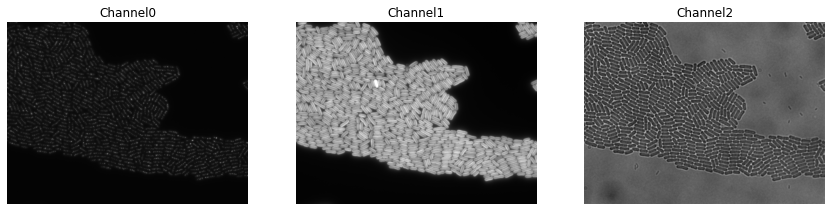

In [66]:
get_ipython().run_line_magic('matplotlib', 'inline')
pixels = image.getPrimaryPixels()
channels = image.getChannels()
plt.figure(figsize=(25, 20))
size_c = image.getSizeC()
for idx in range(0, size_c):
    plt.subplot(1, 5, idx+1)
    image_plane = pixels.getPlane(0, idx, 0)
    plt.imshow(image_plane, cmap='gray')
    plt.axis('off')
    plt.title('Channel' + str(idx))

# List Channels (loads the Rendering settings to get channel colors)

In [67]:

for channel in image.getChannels():
    print('Channel:', channel.getLabel())
    print('Color:', channel.getColor().getRGB())
    print('Lookup table:', channel.getLut())
    print('Is reverse intensity?', channel.isReverseIntensity())

Channel: TagYFP
Color: (0, 255, 0)
Lookup table: None
Is reverse intensity? False
Channel: DsRed
Color: (255, 0, 0)
Lookup table: None
Is reverse intensity? False
Channel: TL Brightfield
Color: (255, 255, 255)
Lookup table: None
Is reverse intensity? False


In [68]:
def find_chan(image,channel):
    
    """
    Finds the specified channel number from the image metadata
    """
    
    for i, chan in enumerate(image.getChannels()):
        #print(i, dic)
        if chan.getLabel() == channel:
            return i
    return -1

# Find DsRed channel for segmentation

In [69]:
dsred_channel = find_chan(image,'DsRed')
dsred = pixels.getPlane(0, dsred_channel, 0)
dsred.shape

(1460, 1936)

In [70]:
!nvcc --version
!nvidia-smi

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2019 NVIDIA Corporation
Built on Wed_Oct_23_19:32:27_Pacific_Daylight_Time_2019
Cuda compilation tools, release 10.2, V10.2.89
Wed Feb 03 11:38:48 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 441.22       Driver Version: 441.22       CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX 166... WDDM  | 00000000:1C:00.0 Off |                  N/A |
|  0%   36C    P8    13W / 130W |   4341MiB /  6144MiB |      2%      Default |
+-------------------------------+----------------------+----------------------+
                                                                

In [71]:
use_GPU = models.use_gpu()
print('>>> GPU activated? %d'%use_GPU)

** TORCH CUDA version installed and working. **
>>> GPU activated? 1


# Segment image with Cellpose

In [72]:
model = models.Cellpose(gpu=True,model_type='cyto')
masks, flows, styles, diams = model.eval(dsred, diameter=20)
# save results
#io.masks_flows_to_seg(dsred, masks, flows, diams, f)




** TORCH CUDA version installed and working. **
>>>> using GPU
processing 1 image(s)
time spent: running network 10.23s; flow+mask computation 45.47
estimated masks for 1 image(s) in 55.80 sec
>>>> TOTAL TIME 55.80 sec


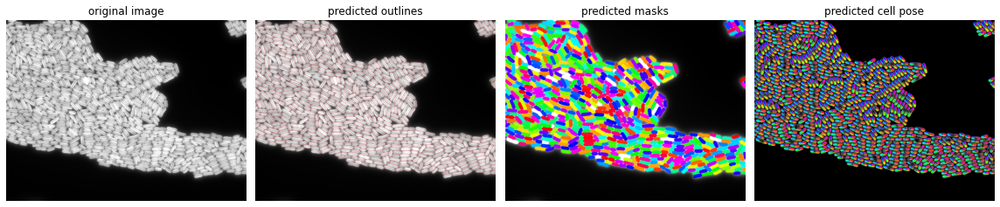

In [73]:
fig = plt.figure(figsize=(16,5))
plot.show_segmentation(fig, dsred, masks, flows[0])
plt.tight_layout()
plt.show()

In [74]:
updateService = conn.getUpdateService()


# Turn labelled image (mask) into a mask for OMERO

In [75]:
msks = omero_rois.masks_from_label_image(masks)

In [76]:

# We have a helper function for creating an ROI and linking it to new shapes
def create_roi(img, shapes):
    # create an ROI, link it to Image
    roi = omero.model.RoiI()
    # use the omero.model.ImageI that underlies the 'image' wrapper
    roi.setImage(img._obj)
    for shape in shapes:
        roi.addShape(shape)
    # Save the ROI (saves any linked shapes too)
    return updateService.saveAndReturnObject(roi)

# Create ROI from mask and attach to image

In [77]:
create_roi(image,msks)

object #0 (::omero::model::Roi)
{
    _id = object #1 (::omero::RLong)
    {
        _val = 103
    }
    _details = object #2 (::omero::model::Details)
    {
        _owner = object #3 (::omero::model::Experimenter)
        {
            _id = object #4 (::omero::RLong)
            {
                _val = 52
            }
            _details = object #5 (::omero::model::Details)
            {
                _owner = <nil>
                _group = <nil>
                _creationEvent = <nil>
                _updateEvent = <nil>
                _permissions = object #6 (::omero::model::Permissions)
                {
                    _restrictions = 
                    {
                        [0] = False
                        [1] = True
                        [2] = True
                        [3] = True
                        [4] = True
                        [5] = True
                    }
                    _extendedRestrictions = 
                    {
               

# Disconnect from server to free up resources

In [78]:
def disconnect(conn):
    """
    Disconnect from an OMERO server
    :param conn: The BlitzGateway
    """
    conn.close()

disconnect(conn)